In [1]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np

from matplotlib import rcParams
from matplotlib import ticker
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
from scipy.stats import zscore
from sklearn.impute import KNNImputer
from scipy.spatial import distance
from scipy.interpolate import interp1d
from scipy import stats
from scipy.stats import chi2
from scipy.spatial.distance import mahalanobis
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

In [2]:
from pathlib import Path
print(Path.cwd())

from os import walk

#This is the folder path, replace to your own local path
dir_path = r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Sang_Code_Processing_2024\0. Raw data\Year 3\Desigo\Zone CO2'

file_list = []
for (dir_path, dir_names, file_names) in walk(dir_path):
    file_list.extend(file_names)
    # don't look inside any subdirectory
    break
print(file_list)

c:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Code Year3
['HZ_Z11_CO2_Y3_raw.csv', 'HZ_Z12+13_CO2_Y3_raw.csv', 'HZ_Z15+16_CO2_Y3_raw.csv', 'HZ_Z17_CO2_Y3_raw.csv', 'HZ_Z1_CO2_Y3_raw.csv', 'HZ_Z21_CO2_Y3_raw.csv', 'HZ_Z22+23_CO2_Y3_raw.csv', 'HZ_Z24_CO2_Y3_raw.csv', 'HZ_Z25+26+27_CO2_Y3_raw.csv', 'HZ_Z31_CO2_Y3_raw.csv', 'HZ_Z32_CO2_Y3_raw.csv', 'HZ_Z33_CO2_Y3_raw.csv', 'HZ_Z3_CO2_Y3_raw.csv', 'HZ_Z4_CO2_Y3_raw.csv', 'HZ_Z5_CO2_Y3_raw.csv']


In [3]:
# IMPORTANT: If you get an error in reading the files do the following:
import os
Lst = []
for i in range(0, len(file_list)):
    # Construct the full path for each file
    file_path = os.path.join(dir_path, file_list[i])
    # Use the full path to read the CSV file
    data = pd.read_csv(file_path, parse_dates=['Timestamp'], index_col=[0])
    filtered_df = data[data['QualityGood'] == True]
    print(len(filtered_df))
    Lst.append(filtered_df)

523508
523507
523507
523507
523508
523507
523507
523507
523505
523503
523505
523503
523509
523507
523507


In [4]:
Lst_CO2 = []
Lst_name = []
#Initialize an empty DataFrame to compile resampled data from each DataFrame in Lst
Zone_CO2 = pd.DataFrame()
res = 1
#This part will take care of timestamp corrections, ensuring the output is always EST!
for i in range(0,len(Lst)):
    #Convert the index of the current DataFrame to datetime format with UTC timezone
    Lst[i].index = pd.to_datetime(Lst[i].index, errors='coerce', utc=True, format='mixed')
    #Convert the timezone of the index from UTC to US/Eastern
    Lst[i].index = Lst[i].index.tz_convert('US/Eastern')
    #Resample the DataFrame to a 1-minute frequency using the mean for aggregation. (This is for analysis)
    #forward fill missing data resulting from the resampling.
    Lst[i] = Lst[i].resample("1T").mean().ffill()
    #Extract the name of the first column of the DataFrame.
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    #Convert the specified column's data to numeric to ensure consistency for calculations.
    Z = pd.to_numeric(Lst[i][zone_name])
    Lst_CO2.append(Z.tolist())
    #Create a new column in 'Zone_CO2' with the name of the current zone.
    Zone_CO2[zone_name] = pd.Series(Z, index=Lst[i].index)
    
Zone_CO2

C:\Users\Sang\AppData\Local\Temp\ipykernel_36176\3212489121.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_36176\3212489121.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_36176\3212489121.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_36176\3212489121.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_36176\3212489121.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version,

,Z11_CO2 (ppm),Z12+13_CO2 (ppm),Z15+16_CO2 (ppm),Z17_CO2 (ppm),Z1_CO2 (ppm),Z21_CO2 (ppm),Z22+23_CO2 (ppm),Z24_CO2 (ppm),Z25+26+27_CO2 (ppm),Z31_CO2 (ppm),Z32_CO2 (ppm),Z33_CO2 (ppm),Z3_CO2 (ppm),Z4_CO2 (ppm),Z5_CO2 (ppm)
Timestamp,,,,,,,,,,,,,,,
2022-06-01 00:00:00-04:00,390.079987,423.040009,432.000000,424.640015,414.399994,390.079987,419.519989,478.079987,390.079987,390.079987,426.559998,436.319992,421.439987,390.079987,390.079987
2022-06-01 00:01:00-04:00,390.079987,424.959991,432.320007,425.920013,414.720001,390.079987,419.519989,481.279999,390.079987,390.079987,425.600006,434.559998,420.799988,390.079987,390.079987
2022-06-01 00:02:00-04:00,390.079987,425.279999,429.760010,426.559998,416.320007,390.079987,420.799988,486.079987,390.079987,390.079987,422.399994,435.200012,417.600006,390.079987,390.079987
2022-06-01 00:03:00-04:00,390.079987,428.480011,429.760010,421.440002,416.959991,390.079987,422.399994,489.279999,390.079987,390.079987,419.519989,431.040009,418.559998,390.079987,390.079987
2022-06-01 00:04:00-04:00,390.079987,430.720001,429.760010,420.480011,416.320007,390.079987,423.040009,489.279999,390.079987,390.079987,422.720001,429.119995,422.399994,390.079987,390.079987
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-05-31 23:55:00-04:00,427.200012,430.079987,461.760010,525.760010,420.160004,443.839996,435.200012,536.640015,428.480011,390.079987,463.679993,436.480011,563.520020,502.079987,496.640015
2023-05-31 23:56:00-04:00,433.600006,426.559998,463.359985,528.320007,420.160004,443.519989,434.559998,533.119995,427.519989,390.079987,461.440002,437.760010,563.520020,499.200012,496.320007
2023-05-31 23:57:00-04:00,433.600006,426.559998,453.119995,528.320007,420.160004,443.519989,434.559998,533.119995,427.519989,390.079987,461.440002,435.519989,563.520020,499.200012,496.320007


<Axes: xlabel='Timestamp'>

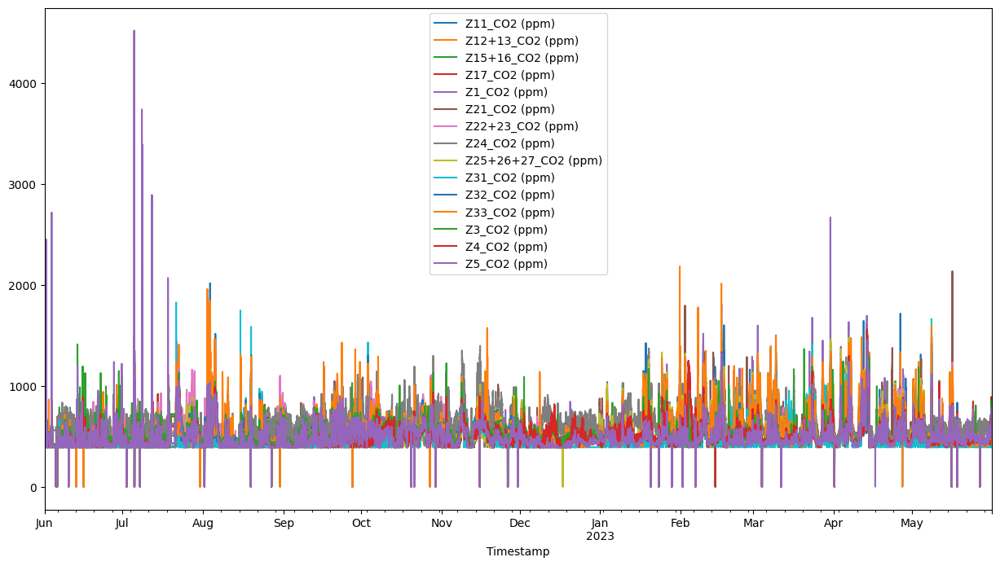

In [5]:
Zone_CO2.plot(figsize=(15, 8))

In [6]:
#Initialize lists for storing differences and names (Difference Analysis)
Lst_diff = []
Lst_name = []
#Loop through each DataFrame to calculate and store differences in data.
for i in range(0,len(Lst)):
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    Z = pd.to_numeric(Lst[i][zone_name])
    #Calculate the difference between consecutive data points.
    temp = Z.diff()
    #Store the differences, excluding the last one, and sorting to facilitate analysis (2000 most significant differences).
    Lst_diff.append(temp.sort_values(ascending=True)[-2000:-1].tolist())
    
# print (Lst_diff)
#Restructure the dataframe for visual analysis
df = pd.DataFrame(Lst_diff).transpose()

df.columns = Lst_name
df   

,Z11_CO2 (ppm),Z12+13_CO2 (ppm),Z15+16_CO2 (ppm),Z17_CO2 (ppm),Z1_CO2 (ppm),Z21_CO2 (ppm),Z22+23_CO2 (ppm),Z24_CO2 (ppm),Z25+26+27_CO2 (ppm),Z31_CO2 (ppm),Z32_CO2 (ppm),Z33_CO2 (ppm),Z3_CO2 (ppm),Z4_CO2 (ppm),Z5_CO2 (ppm)
0,10.879944,10.239990,10.880005,10.239990,10.240021,10.880005,11.839966,28.160004,10.559998,17.280029,10.240051,12.800049,12.480042,10.559998,11.200012
1,10.879944,10.239990,10.880005,10.239990,10.240021,10.880005,11.839966,28.160004,10.559998,17.280029,10.240051,12.800049,12.480042,10.559998,11.200012
2,10.879944,10.239990,10.880005,10.239990,10.240021,10.880005,11.839966,28.160004,10.559998,17.280029,10.240051,12.800049,12.480042,10.559998,11.200012
3,10.879974,10.239990,10.880005,10.239990,10.240021,10.880005,11.839966,28.160004,10.559998,17.280029,10.240051,12.800049,12.480042,10.559998,11.200012
4,10.879974,10.239990,10.880005,10.239990,10.240021,10.880005,11.839966,28.160004,10.559998,17.280029,10.240051,12.800049,12.480042,10.559998,11.200012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1994,617.599976,586.880005,650.880005,523.520020,663.039978,544.000000,684.160065,743.679993,661.119995,481.920013,709.119995,753.919983,528.640015,575.039978,568.000000
1995,640.000000,592.000000,713.599976,561.599976,690.559998,545.919983,689.919983,762.880005,762.239990,586.239990,728.320007,813.440002,557.760010,652.799988,640.000000
1996,733.440002,640.320007,758.400024,566.719971,721.280029,642.559998,714.880005,883.840027,783.359985,624.320038,737.920013,837.760040,567.679993,664.960022,647.679993
1997,831.359985,736.640015,785.919983,630.080017,740.479980,752.000000,967.679993,984.960022,812.799988,661.119995,770.559998,867.200012,671.359985,762.239990,666.239990


<Axes: >

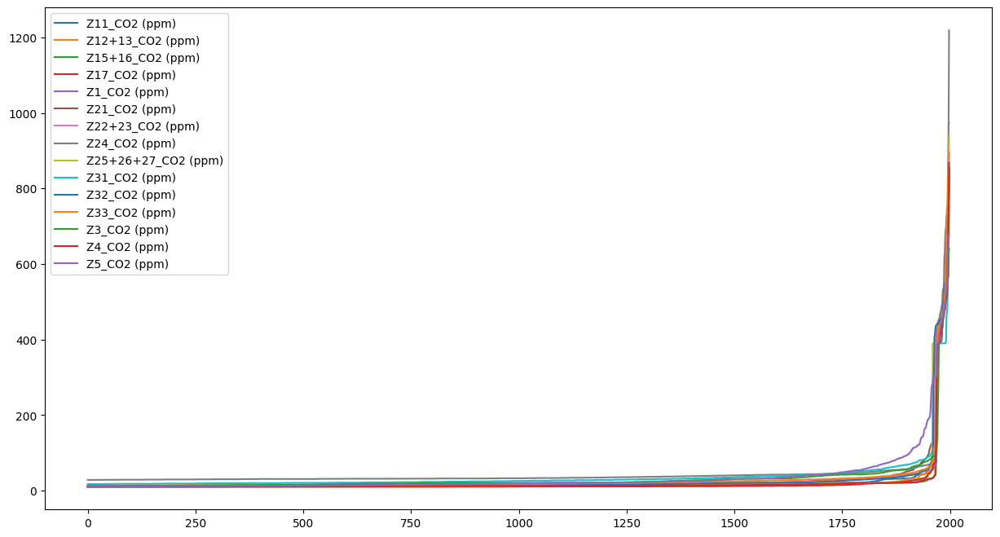

In [7]:
df.plot(figsize=(15, 8))

In [8]:
#Observe the .8 quantile (where 80% of the differences lie in)
df.quantile(0.8)

Z11_CO2 (ppm)          20.479980
Z12+13_CO2 (ppm)       13.440027
Z15+16_CO2 (ppm)       17.599976
Z17_CO2 (ppm)          12.799988
Z1_CO2 (ppm)           21.119995
Z21_CO2 (ppm)          21.760010
Z22+23_CO2 (ppm)       21.760010
Z24_CO2 (ppm)          42.239990
Z25+26+27_CO2 (ppm)    17.919983
Z31_CO2 (ppm)          38.400024
Z32_CO2 (ppm)          20.480066
Z33_CO2 (ppm)          26.880005
Z3_CO2 (ppm)           32.000000
Z4_CO2 (ppm)           15.360046
Z5_CO2 (ppm)           33.920007
Name: 0.8, dtype: float64

In [9]:
# Update 'Lst_name' to contain the names of columns
Lst_name = Zone_CO2.columns.values

Absolute Difference

In [10]:
Zone_CO2.describe()

,Z11_CO2 (ppm),Z12+13_CO2 (ppm),Z15+16_CO2 (ppm),Z17_CO2 (ppm),Z1_CO2 (ppm),Z21_CO2 (ppm),Z22+23_CO2 (ppm),Z24_CO2 (ppm),Z25+26+27_CO2 (ppm),Z31_CO2 (ppm),Z32_CO2 (ppm),Z33_CO2 (ppm),Z3_CO2 (ppm),Z4_CO2 (ppm),Z5_CO2 (ppm)
count,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000
mean,492.797682,516.724063,533.733680,514.028124,524.166544,491.379565,540.756328,583.001139,499.587684,457.708836,519.167307,539.160044,520.943561,502.535468,493.018574
std,132.630221,119.324455,130.749905,120.014431,136.664902,149.436448,152.199192,148.388559,160.409323,130.093725,129.810257,158.333887,104.921484,114.561076,121.111799
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,412.480011,438.079987,445.760010,434.880005,437.440002,390.079987,434.880005,467.519989,390.079987,390.079987,432.640015,438.720001,449.920013,425.279999,418.559998
50%,447.679993,476.799988,489.279999,477.119995,477.440002,428.160004,483.200012,560.640015,435.519989,390.079987,472.000000,481.920013,495.040009,475.519989,461.440002
75%,521.280029,557.440002,583.679993,551.039978,569.280029,528.000000,596.799988,668.159973,532.479980,471.359985,563.840027,586.559998,561.280029,546.880005,535.679993
max,1715.199951,1440.000000,1537.280029,1523.199951,2667.520020,2133.760010,1512.959961,1411.839966,1515.520020,1824.000000,2016.000000,2181.120117,1528.319946,1557.760010,4518.399902


In [11]:
#If the absolute difference between consecutive values is greater than 100, drop them.
#IMPORTANT: Observe statistical summary to determine the abs diff condition.
for i in range(len(Lst_name)):
    col_name = Lst_name[i]
    df = Zone_CO2[col_name]
    #Drop rows where the difference exceeds 100
    to_drop = df[abs(df.diff()) > 100].index
    Zone_CO2[col_name] = df.drop(to_drop)
    #Apply linear interpolation to fill gaps
    Zone_CO2[col_name] = Zone_CO2[col_name].interpolate()

<Axes: xlabel='Timestamp'>

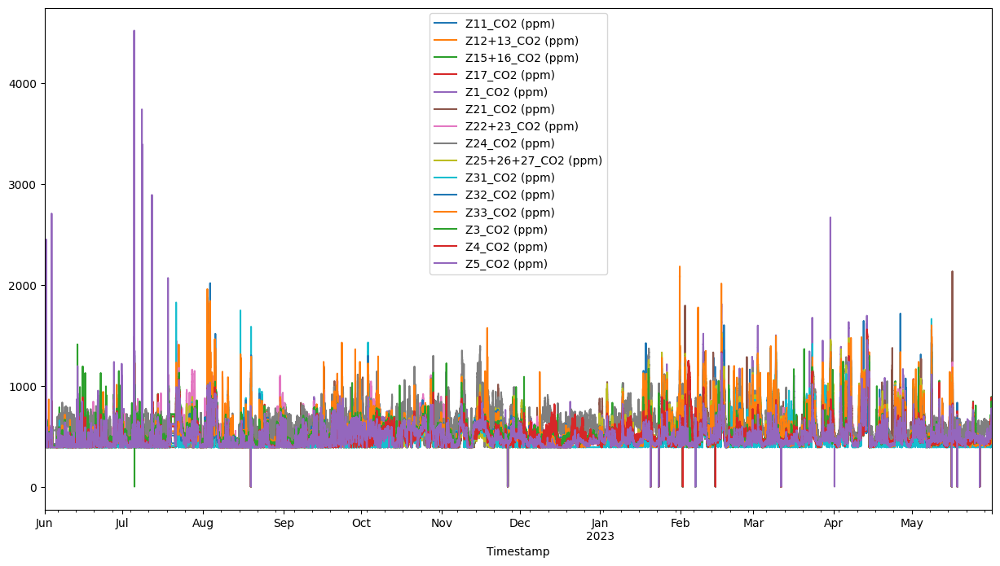

In [12]:
Zone_CO2.plot(figsize=(15, 8))

In [13]:
# #Using DBSCAN to remove outliers
# #Standardize the data
# data_scaled = StandardScaler().fit_transform(Zone_CO2)

# #Apply DBSCAN
# dbscan = DBSCAN(eps=1.0, min_samples=15)  # Adjust these parameters based on your data
# clusters = dbscan.fit_predict(data_scaled)

# #Replace outliers with np.nan
# Zone_CO2[clusters == -1] = np.nan

# #Plotting (assuming your DataFrame is set up correctly for plotting)
# Zone_CO2.plot(figsize=(15, 8))

MemoryError: 

C:\Users\Sang\AppData\Local\Temp\ipykernel_36176\1923515966.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[clusters == -1] = np.nan
C:\Users\Sang\AppData\Local\Temp\ipykernel_36176\1923515966.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[clusters == -1] = np.nan
C:\Users\Sang\AppData\Local\Temp\ipykernel_36176\1923515966.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

<Axes: xlabel='Timestamp'>

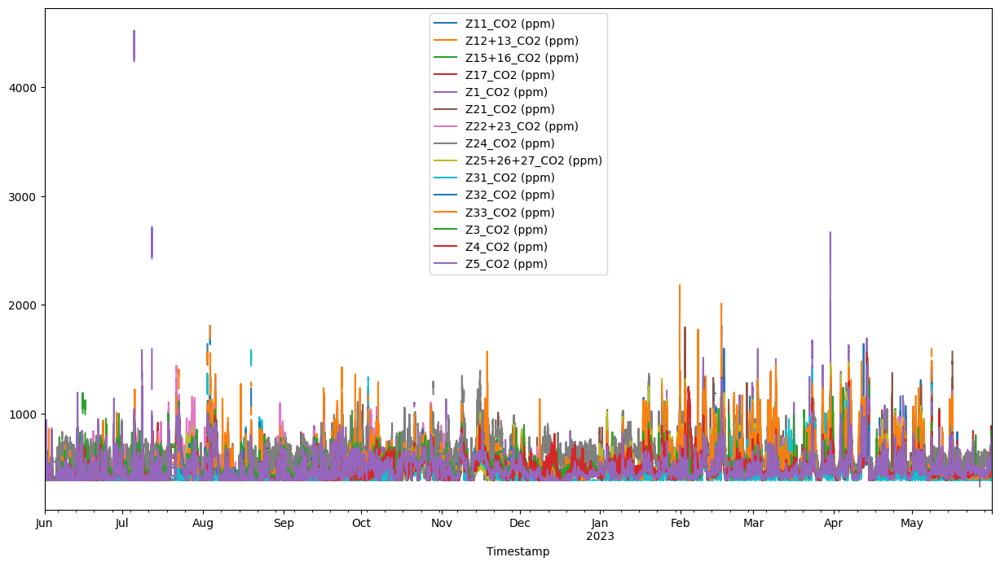

In [13]:
def process_batch(data, eps=1.0, min_samples=15):
    #Standardize the data
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)

    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    clusters = dbscan.fit_predict(data_scaled)

    data[clusters == -1] = np.nan
    return data

#Number of batches
n_batches = 3

#Split the dataframe into batches
batch_size = len(Zone_CO2) // n_batches
batches = [Zone_CO2.iloc[i:i + batch_size] for i in range(0, len(Zone_CO2), batch_size)]

#Process each batch with DBSCAN
cleaned_batches = [process_batch(batch) for batch in batches]

#Combine the cleaned data back into a one dataframe
Zone_CO2_cleaned = pd.concat(cleaned_batches)

Zone_CO2_cleaned.plot(figsize=(15, 8))

In [14]:
Zone_CO2 = Zone_CO2_cleaned

C:\Users\Sang\AppData\Local\Temp\ipykernel_36176\1801476030.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  Zone_CO2 = Zone_CO2.resample("H").mean().ffill()


<Axes: xlabel='Timestamp'>

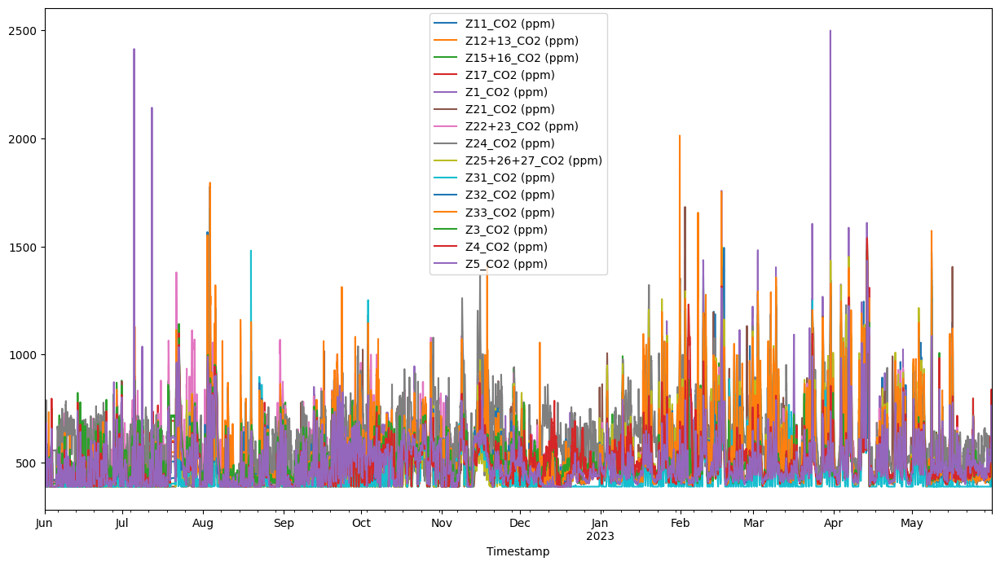

In [15]:
#Process to Hourly and forward fill (average to hour and forward fill to assign last existing value to a missing value)
Zone_CO2 = Zone_CO2.resample("H").mean().ffill()
Zone_CO2.plot(figsize=(15, 8))

In [16]:
Zone_CO2[Zone_CO2 < 100] = np.nan

In [17]:
Zone_CO2.describe()

,Z11_CO2 (ppm),Z12+13_CO2 (ppm),Z15+16_CO2 (ppm),Z17_CO2 (ppm),Z1_CO2 (ppm),Z21_CO2 (ppm),Z22+23_CO2 (ppm),Z24_CO2 (ppm),Z25+26+27_CO2 (ppm),Z31_CO2 (ppm),Z32_CO2 (ppm),Z33_CO2 (ppm),Z3_CO2 (ppm),Z4_CO2 (ppm),Z5_CO2 (ppm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,492.710250,516.712160,533.800688,514.113093,524.169830,491.358999,540.753400,582.910007,499.565534,457.161772,518.795490,538.951215,520.784550,502.569479,492.236531
std,131.449117,118.513644,130.057749,119.540578,135.457111,148.496471,151.436102,145.587721,159.877402,127.494848,127.882111,156.758653,103.035817,113.853795,109.679435
min,390.079987,391.269322,390.079987,390.671988,391.013323,390.079987,391.093323,390.079987,390.079987,390.079987,391.967994,391.727991,393.866665,390.079987,390.079987
25%,412.979998,437.917330,445.808000,434.915999,437.523998,390.079987,435.239999,470.093334,390.079987,390.079987,432.789334,439.422665,450.012001,426.031999,418.813331
50%,447.480000,476.877334,489.447999,477.839997,477.640001,428.581333,483.088000,561.327994,435.432000,391.327990,472.087998,482.581335,495.474666,475.674667,461.463112
75%,520.840664,556.922666,583.641329,551.417333,569.146668,528.465338,595.585333,664.846665,532.433331,470.654666,563.143999,586.965334,561.495997,545.990664,535.413338
max,1494.336015,1402.346670,1473.962671,1487.168005,2498.062229,1682.858667,1496.106671,1365.866674,1502.912002,1677.482674,1776.895988,2012.405110,1514.069334,1538.965346,2413.037714


<Axes: xlabel='Timestamp'>

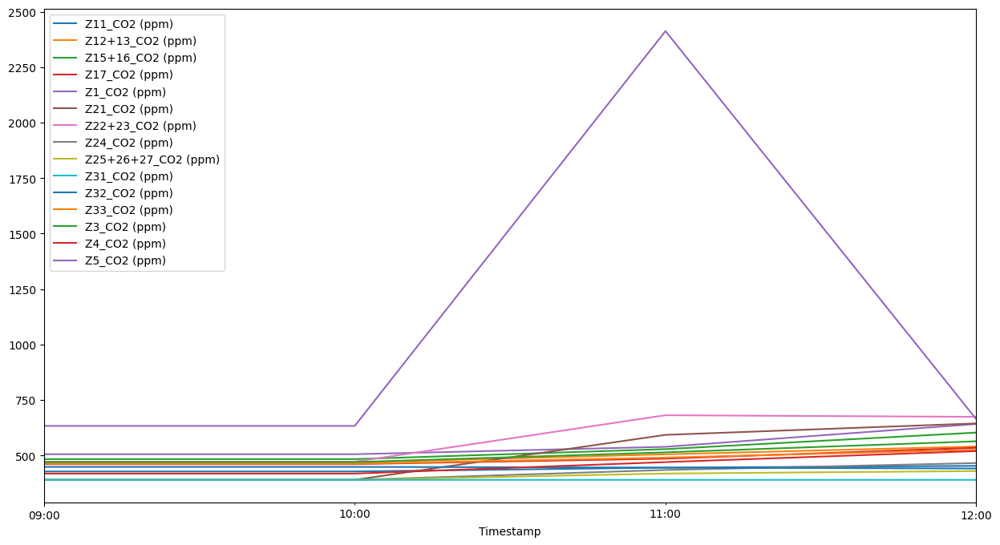

In [18]:
Zone_CO2['2022-07-05 09:00:00':'2022-07-05 12:00:00'].plot(figsize=(15, 8))

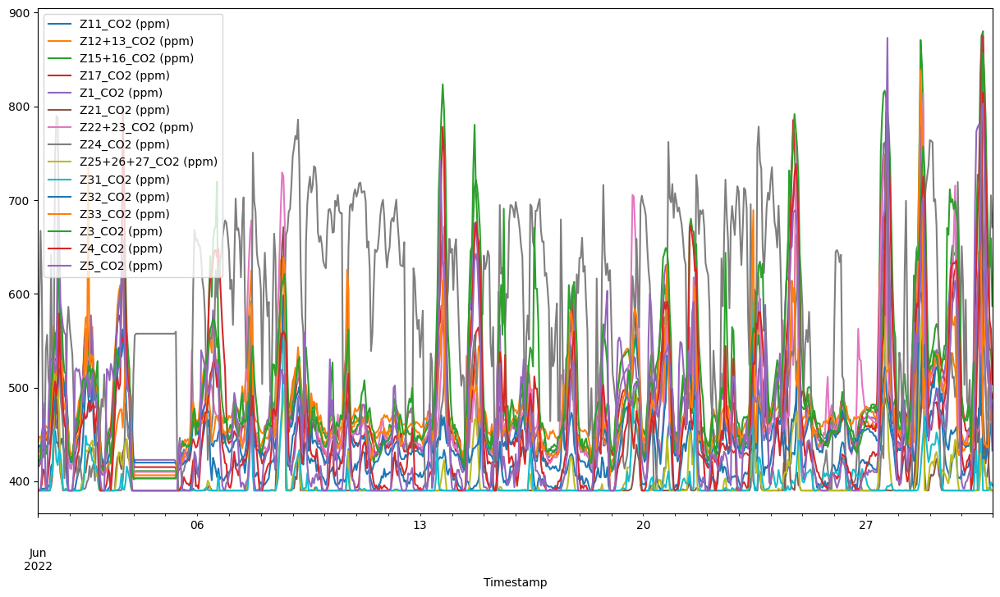

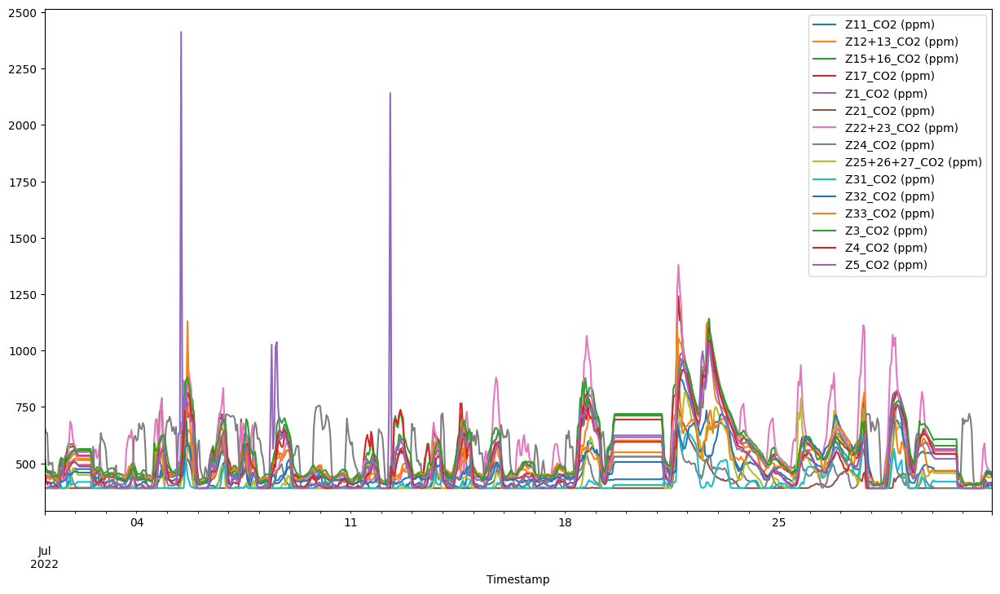

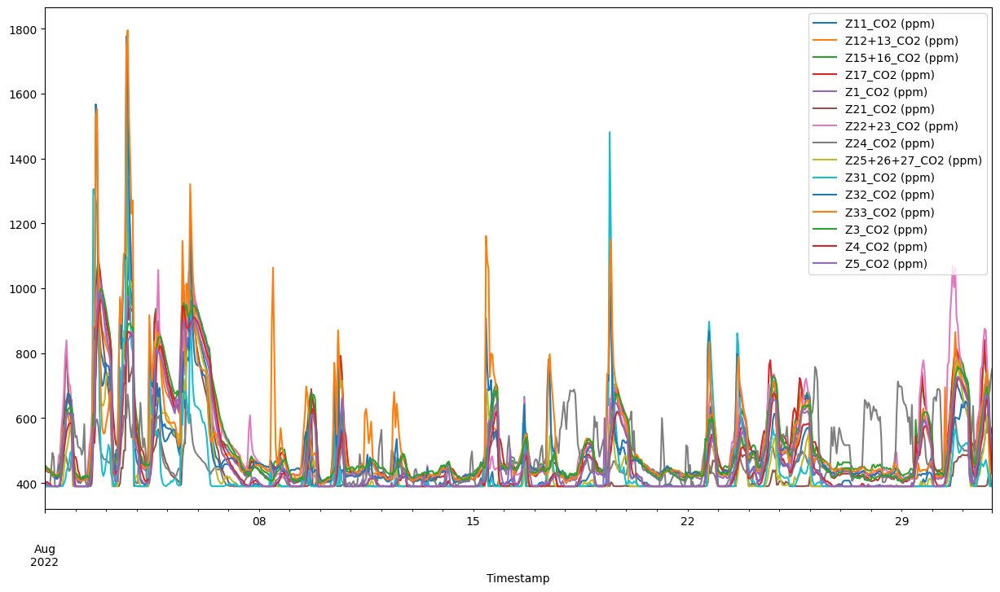

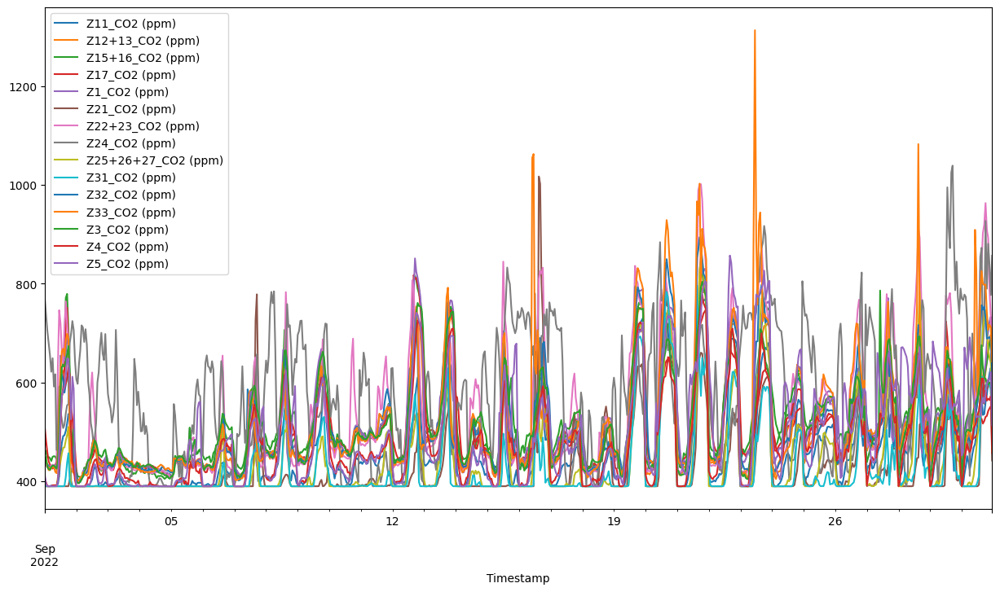

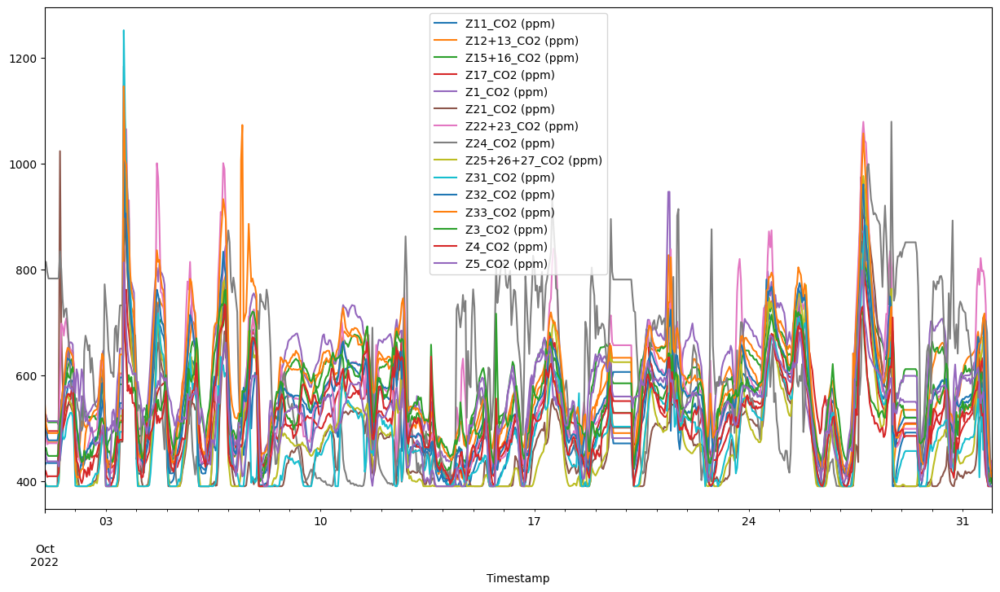

...

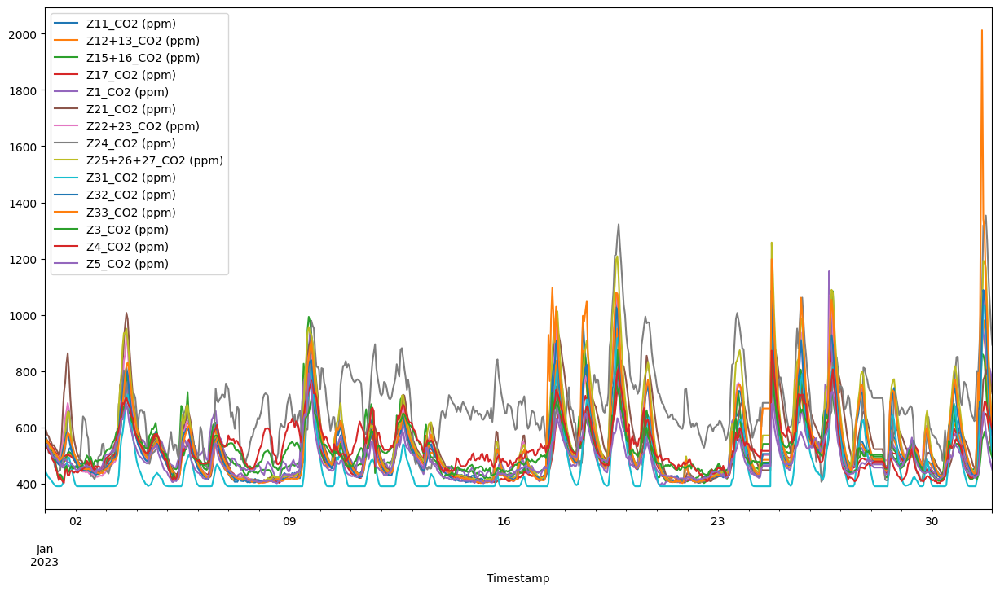

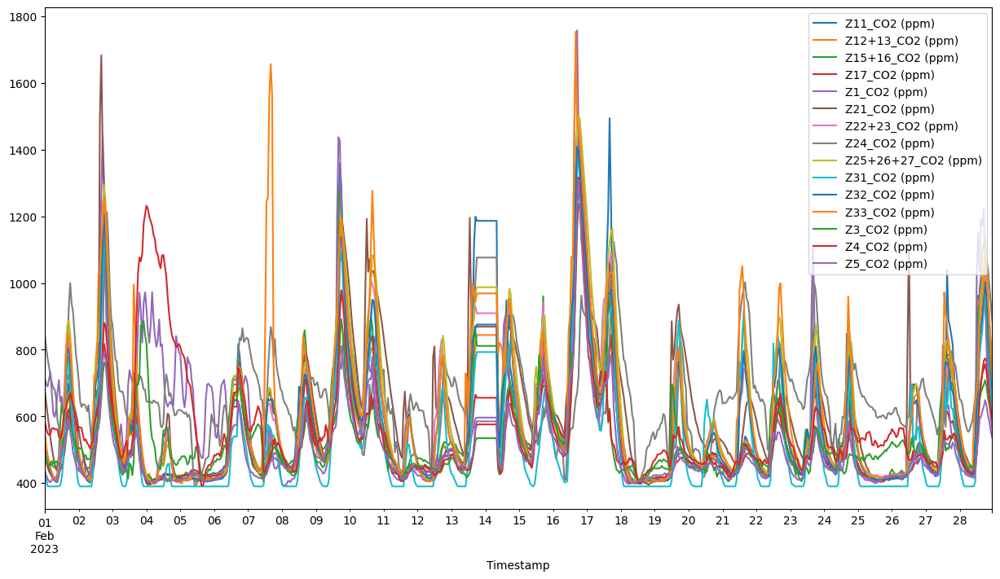

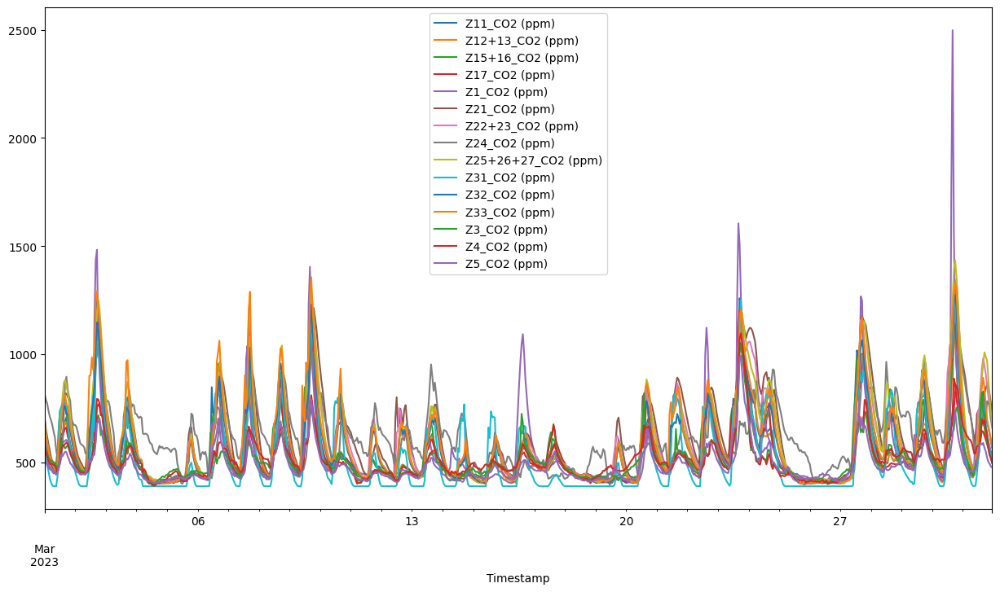

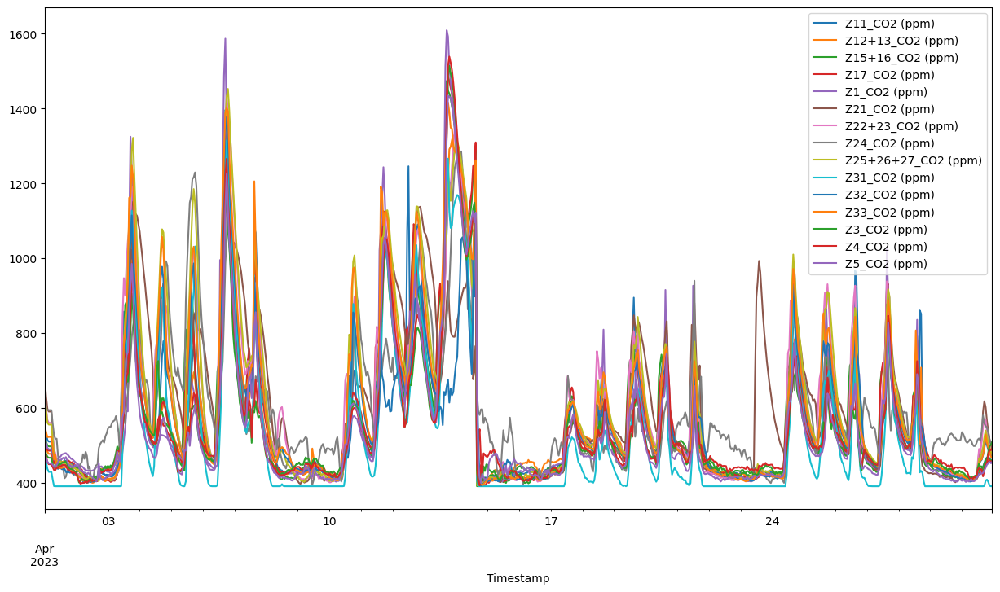

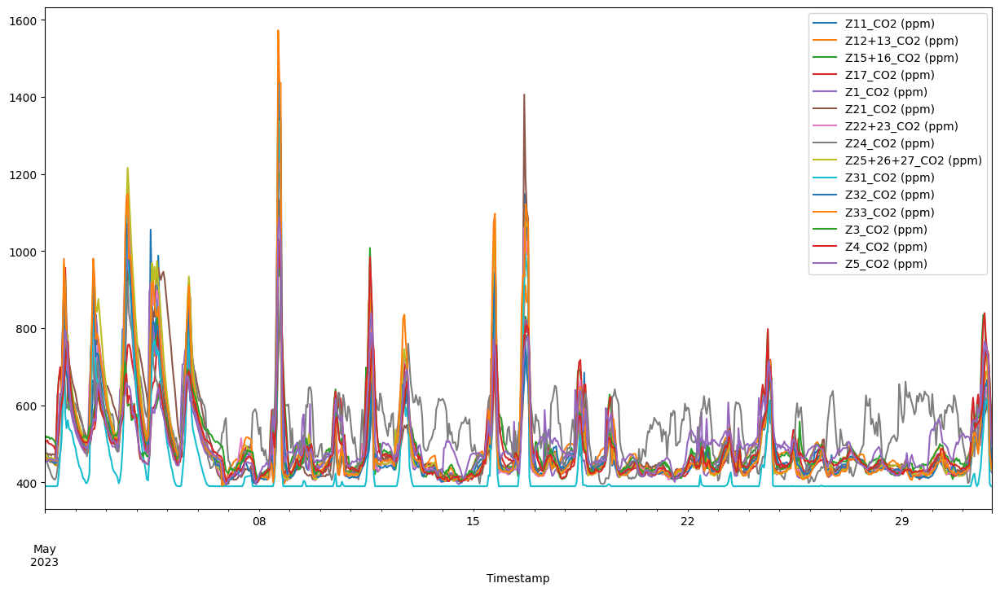

In [19]:
# Then, group by year and week number and apply Mahalanobis distance function
for (year, month), group in Zone_CO2.groupby([Zone_CO2.index.year, Zone_CO2.index.month]):

    group.plot(figsize=(15, 8))

In [20]:
#Missing data check
# Detecting rows with repeated values
repeated_index = (Zone_CO2.diff() == 0).all(axis=1)
repeated_rows = Zone_CO2[repeated_index]

# Now let's get the index of the repeated rows
repeated_rows_index = repeated_rows.index.tolist()

repeated_rows_index

[Timestamp('2022-06-04 03:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 04:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 05:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 06:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 07:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 08:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 09:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 10:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 11:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 12:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 13:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 14:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 15:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 16:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 17:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 18:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 19:00:00-0400', tz='US/Eastern'),
 Timestamp('2022-06-04 20:00:00

In [21]:
Zone_CO2[repeated_index] = np.nan

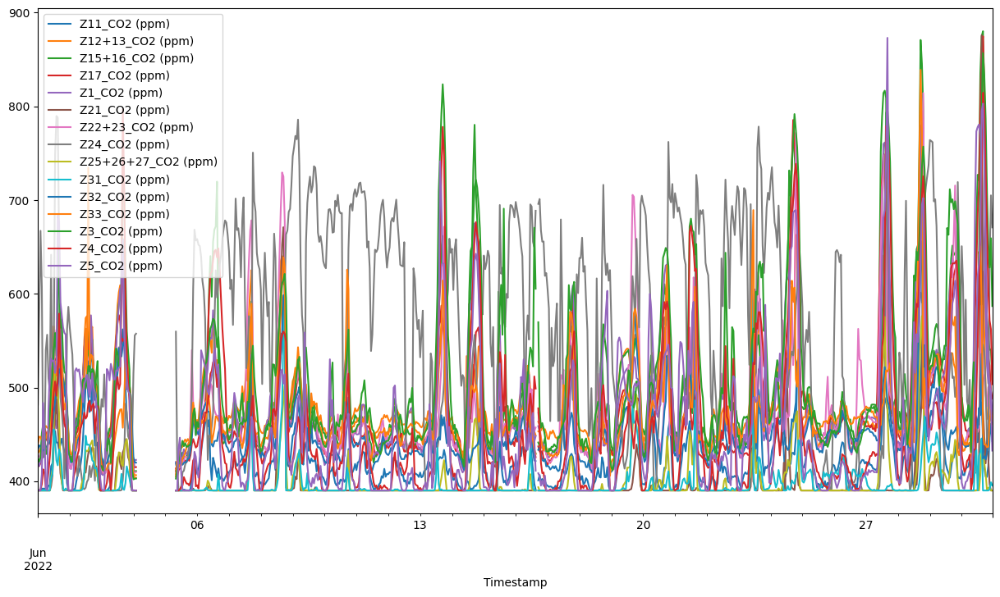

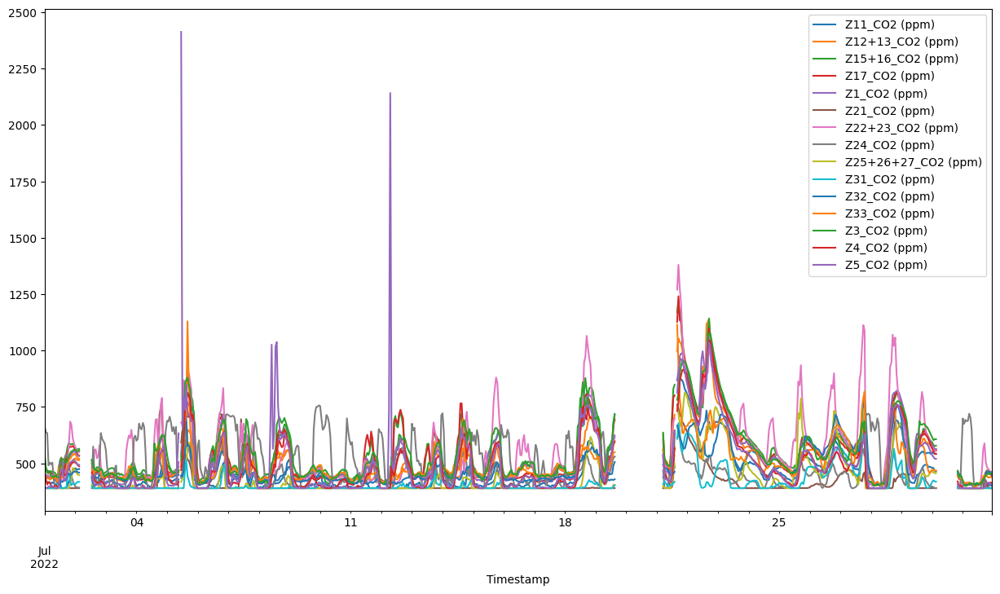

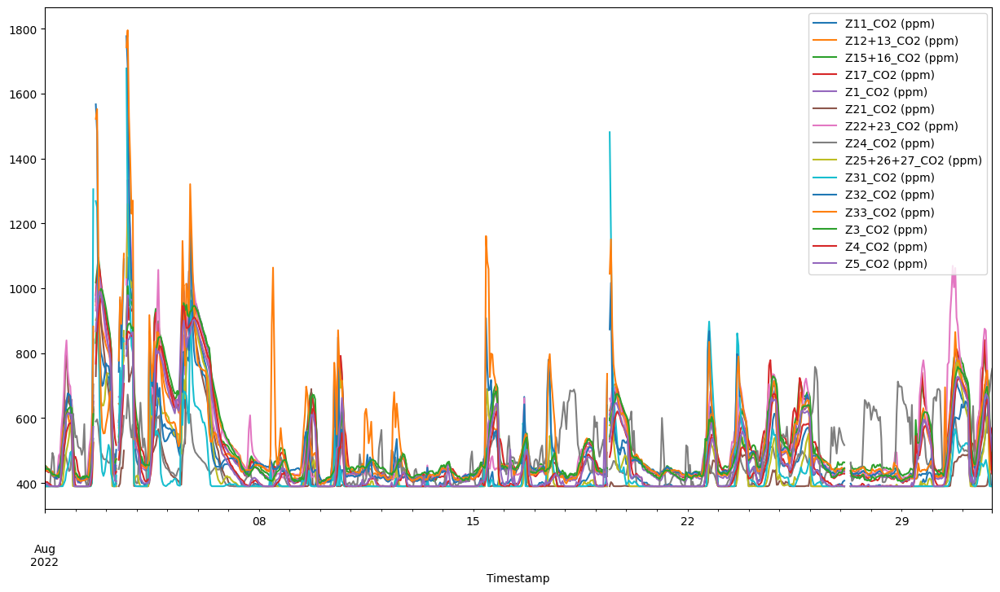

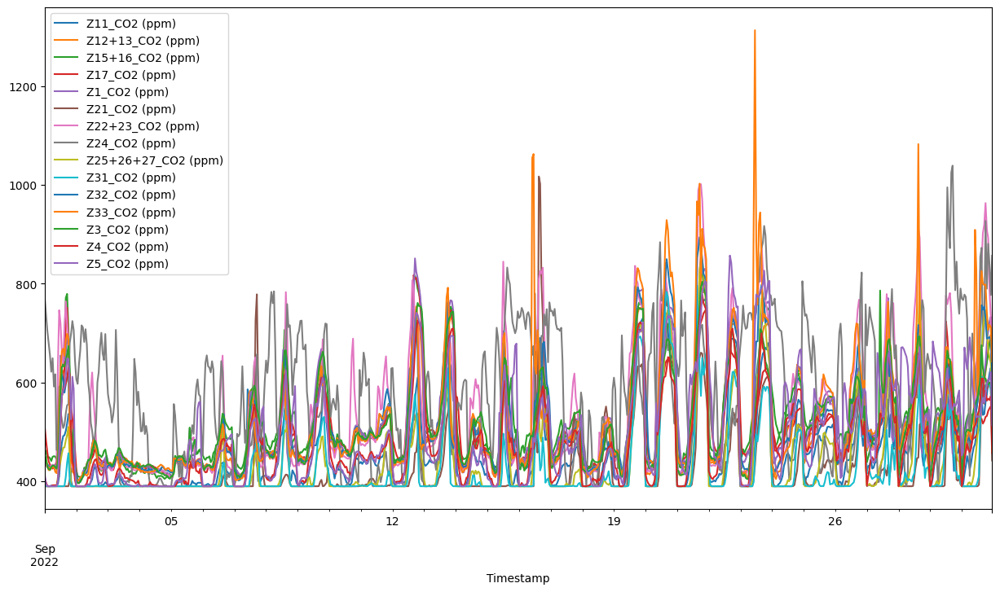

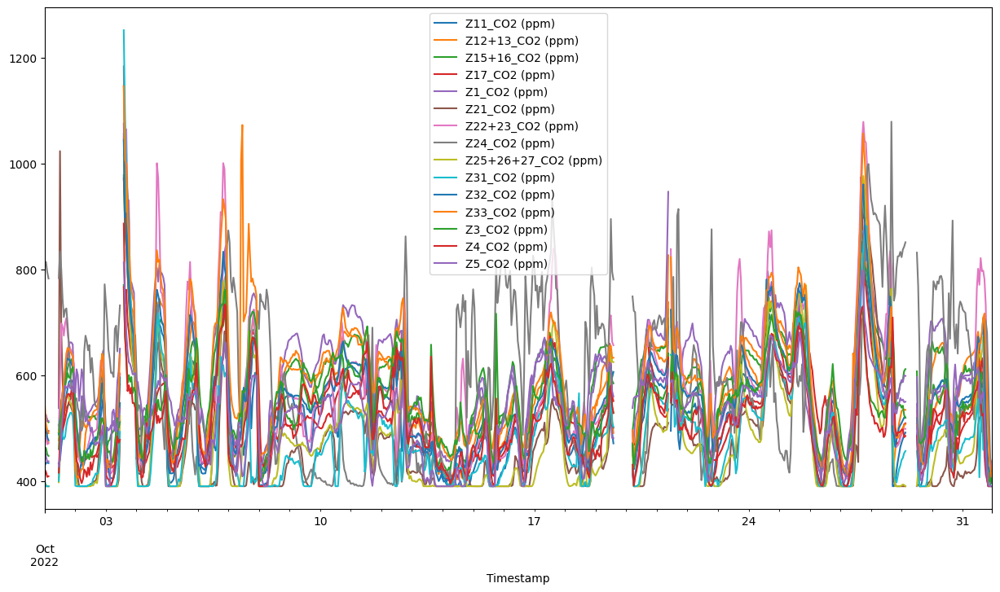

...

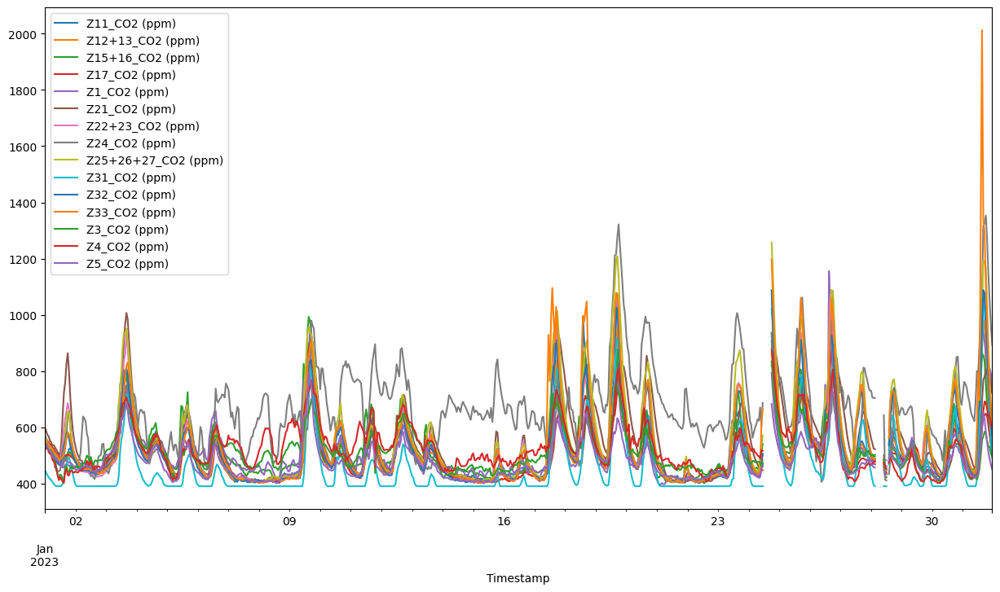

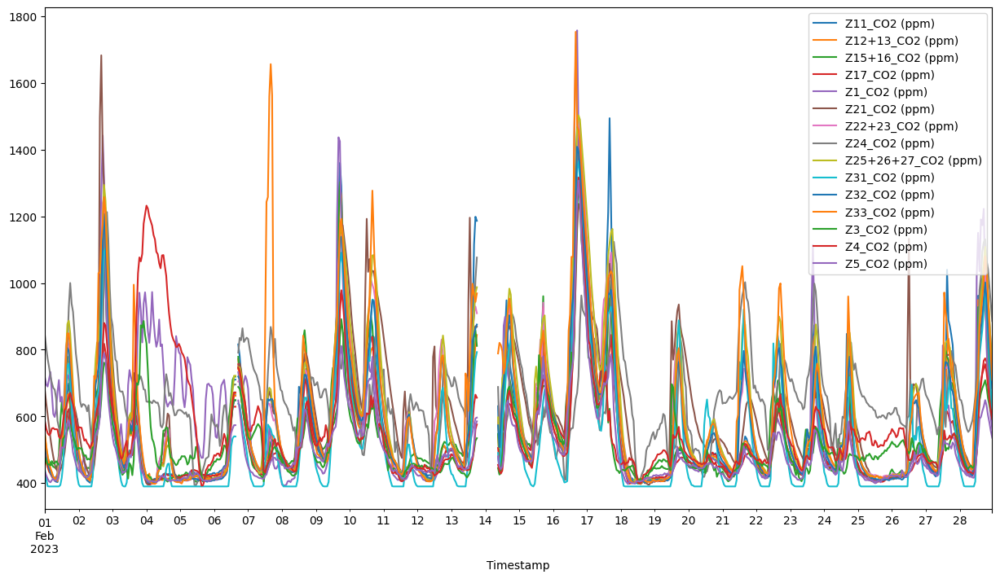

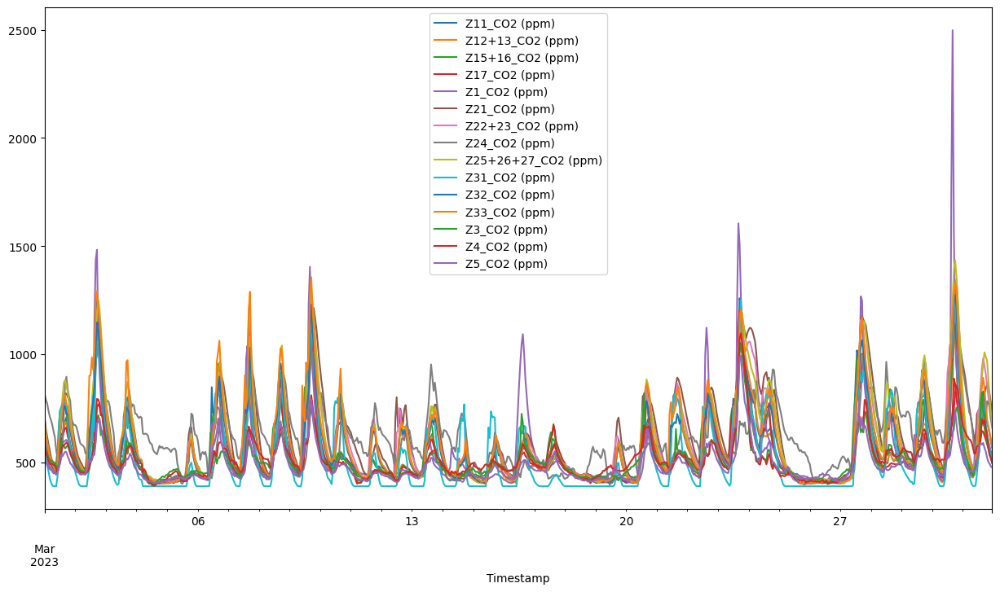

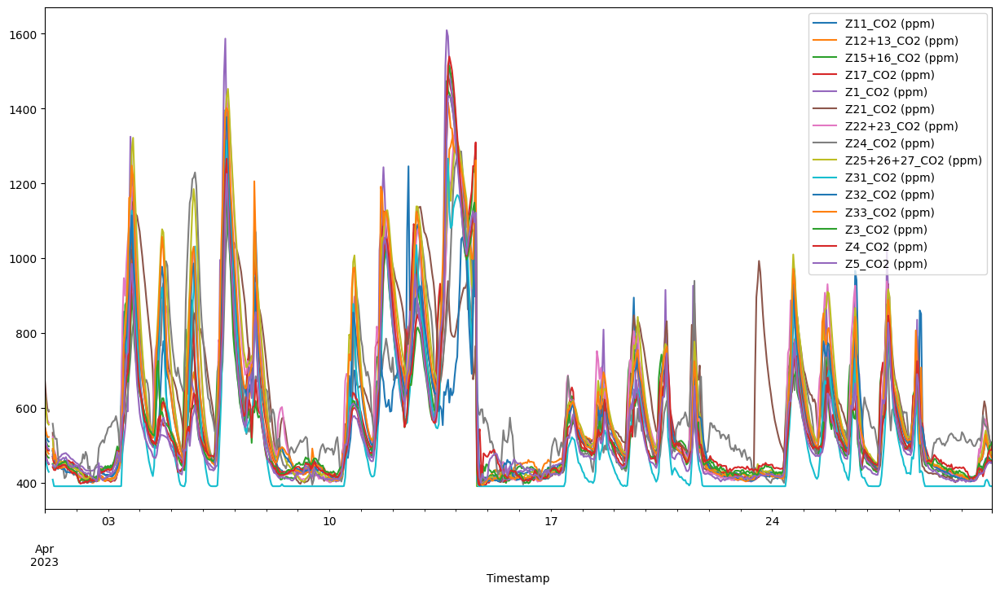

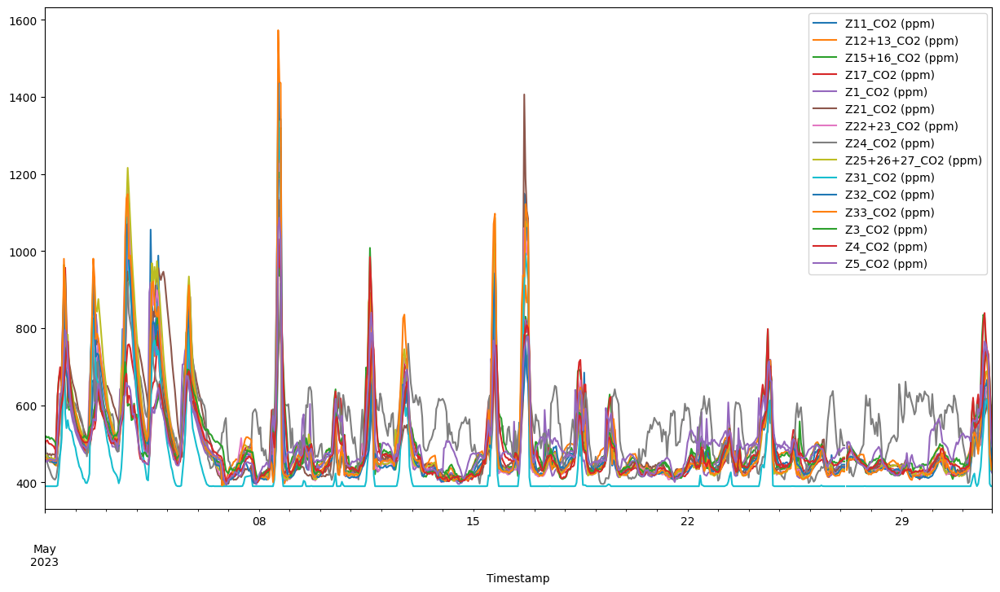

In [22]:
# Then, group by year and week number and apply Mahalanobis distance function
for (year, month), group in Zone_CO2.groupby([Zone_CO2.index.year, Zone_CO2.index.month]):

    group.plot(figsize=(15, 8))

In [23]:
def find_nan_sequences(series):
    is_nan = series.isna()
    if is_nan.any():
        start = end = None
        for i, val in enumerate(is_nan):
            if val and start is None:
                start = i
            elif not val and start is not None:
                end = i - 1
                yield (series.index[start], series.index[end])
                start = end = None
        if start is not None:
            yield (series.index[start], series.index[-1])

# Find and print start and end indices of NaN sequences in each column
empDF = pd.DataFrame()
LstN = []
LstS = []
LstE = []

for column in Zone_CO2.columns:
    for start, end in find_nan_sequences(Zone_CO2[column]):
        print(f"Missing period:'{column}' from {start} to {end}")
        LstN.append(column)
        LstS.append(start)
        LstE.append(end)
        
empDF["names"] = LstN
empDF["start"] = LstS
empDF["end"] = LstE

Missing period:'Z11_CO2 (ppm)' from 2022-06-04 03:00:00-04:00 to 2022-06-05 07:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2022-06-16 16:00:00-04:00 to 2022-06-16 16:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2022-07-02 04:00:00-04:00 to 2022-07-02 12:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2022-07-05 10:00:00-04:00 to 2022-07-05 10:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2022-07-19 16:00:00-04:00 to 2022-07-21 04:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2022-07-21 15:00:00-04:00 to 2022-07-21 15:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2022-07-30 04:00:00-04:00 to 2022-07-30 19:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2022-08-02 15:00:00-04:00 to 2022-08-02 15:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2022-08-03 09:00:00-04:00 to 2022-08-03 09:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2022-08-03 15:00:00-04:00 to 2022-08-03 15:00:00-04:00
Missing period:'Z11_CO2 (ppm)' from 2022-08-19 10:00:00-04:00 to 2022-08-19 10:00:00-04:00

In [25]:
empDF.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Missing Intervals\Year3\Missing_periods_CO2_Year3.csv', index=False)

In [26]:
Zone_CO2.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Processed\Year3\Zone_CO2_Year3.csv', index=True)